# Predictions on DFKV data

Here, we use our previously trained model to compute predictions on our test data. Some of them are showed at the end.



In [1]:
# Installing detectron2
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-cwn6x_wb
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-cwn6x_wb
     |████████████████████████████████| 50 kB 3.0 MB/s 
     |████████████████████████████████| 74 kB 3.1 MB/s 
     |████████████████████████████████| 145 kB 44.6 MB/s 
     |████████████████████████████████| 130 kB 45.9 MB/s 
     |████████████████████████████████| 38.1 MB 1.3 MB/s 
     |████████████████████████████████| 843 kB 39.5 MB/s 
     |████████████████████████████████| 749 kB 43.2 MB/s 
     |████████████████████████████████| 596 kB 49.2 MB/s 
     |████████████████████████████████| 112 kB 40.7 MB/s 
  Created wheel for detectron2: filename=detectron2-0.6-cp37-cp37m-linux_x86_64.whl size=5692113 sha256=39e7f73fc444c0608cd03140cb53bc2dd38ac48ee9b78d3143340a765b6f63da
  Stored in directory: /tmp/pip-ephem-wheel-cache-bk915qed/wheels/07/dc/32/0322cb484dbefab8b9366bfedbaff5060ac7

In [2]:
# Importing Google drive content
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [3]:
# Going into the notebook directory
%cd gdrive/My Drive/newspaper-navigator/newspaper-navigator/notebooks

/content/gdrive/My Drive/newspaper-navigator/newspaper-navigator/notebooks


In [9]:
# Some imports
from PIL import Image
import json
import glob
from pathlib import Path
from tqdm import tqdm
import random
import cv2
import matplotlib.pyplot as plt

import detectron2
from detectron2.data.datasets import register_coco_instances
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.utils.visualizer import Visualizer

What we have is a folder full of our test images (in `../DFKV_data/test/)`. We need to create a json file in COCO format that lists all the images, so that it is detecron2-usable.

In [5]:
# A function that creates the json file
# https://stackoverflow.com/questions/70186513/inference-on-image-dataset-without-annotations-in-detectron2
def add_images_to_coco(image_dir, coco_filename):
    image_filenames = list(glob.glob(image_dir + '*.jpg'))
    images = []
    for i, image_filename in tqdm(enumerate(image_filenames)):
        im = Image.open(image_filename)
        width, height = im.size
        image_details = {
            "id": i + 1,
            "height": height,
            "width": width,
            "file_name": str(Path(image_filename).resolve()),
        }
        images.append(image_details)

    # This will overwrite the image tags in the COCO JSON file
    with open(coco_filename) as f:
        coco = json.load(f)

    coco['images'] = images

    with open(coco_filename, 'w') as coco_file:
        json.dump(coco, coco_file, indent = 4)

In [6]:
#add_images_to_coco("../DFKV_data/test/", "../DFKV_output/test/predictions.json")

1117it [00:21, 52.14it/s] 


Now let's register our COCO dataset.

In [7]:
register_coco_instances("DFKV_test", {}, "../DFKV_output/test/predictions.json", "images")

We set our configuration properly.

In [14]:
cfg = get_cfg()

# sets the testing confidence threshold
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9
cfg.DATASETS.TEST = ("DFKV_test", )

cfg.merge_from_file("../..//detectron2/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.WEIGHTS = "../model_weights/model_final.pth"

predictor = DefaultPredictor(cfg)

And we make a few predictions.


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



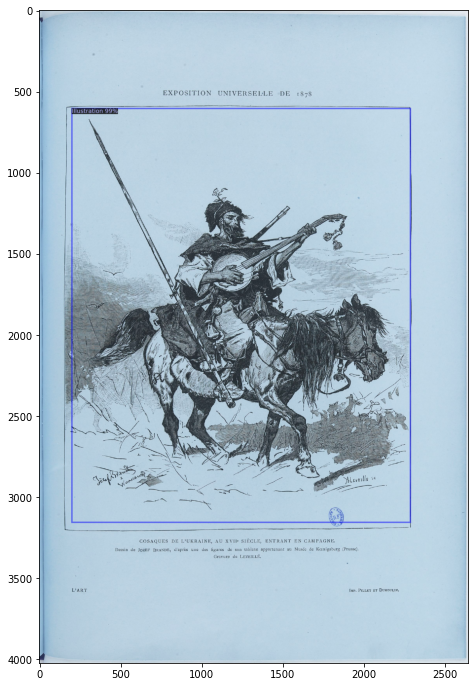

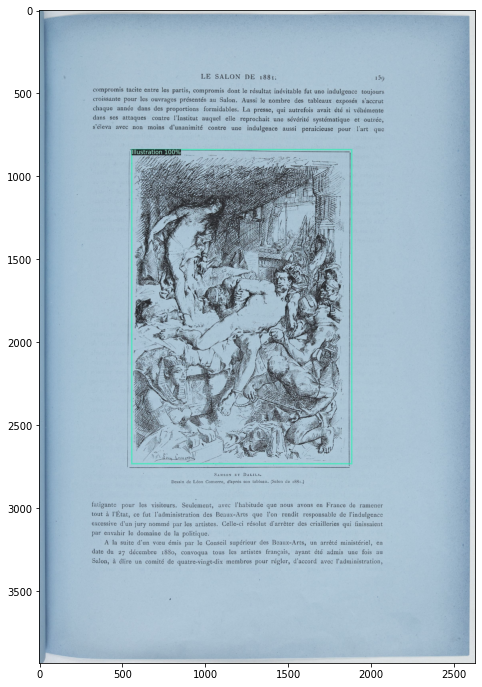

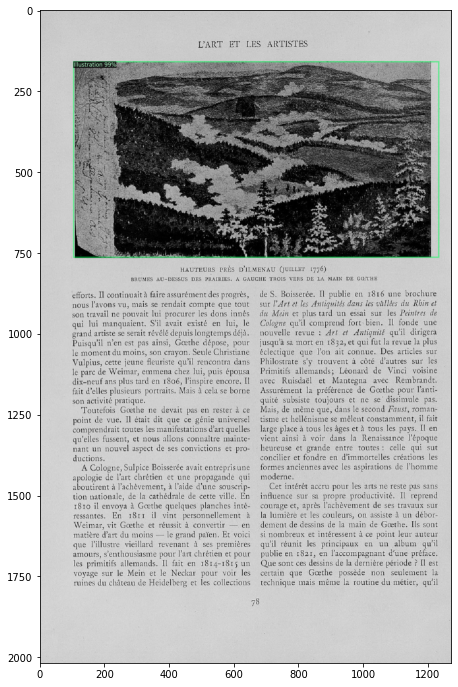

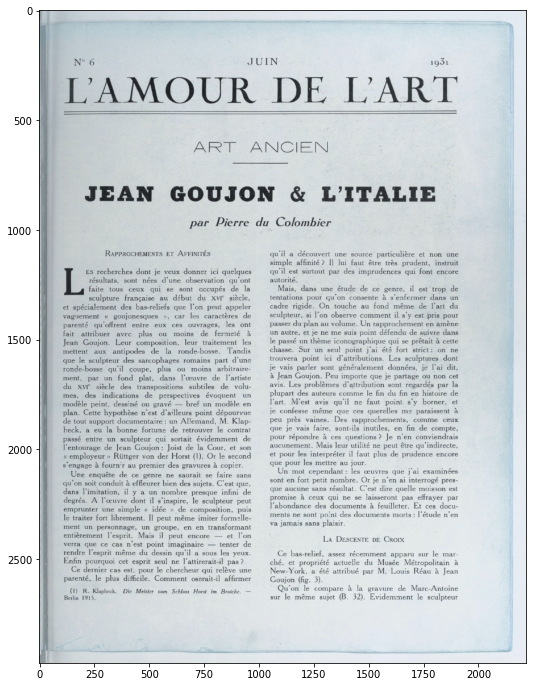

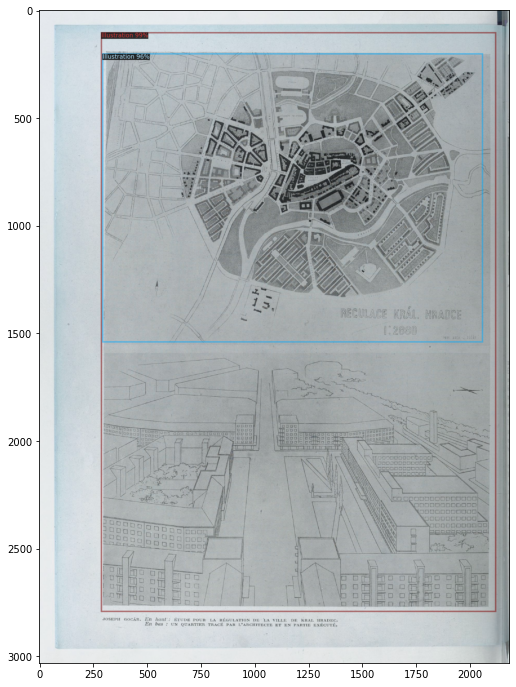

...

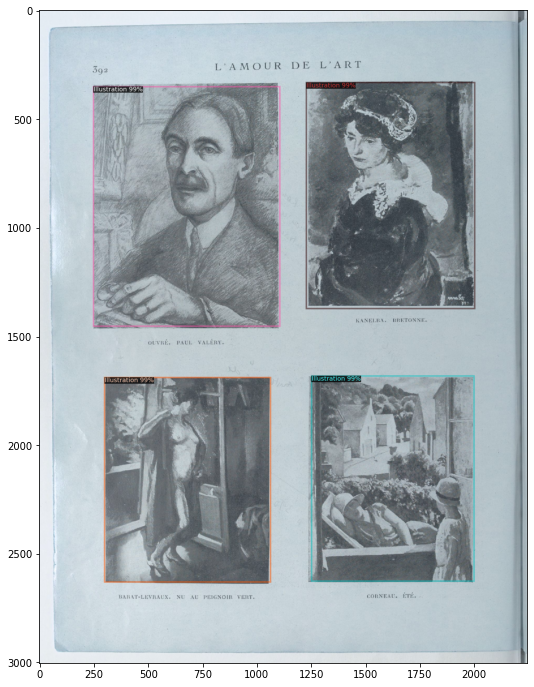

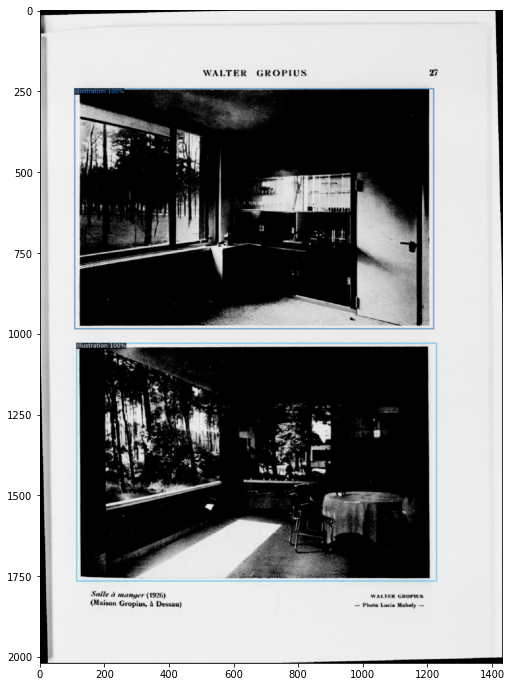

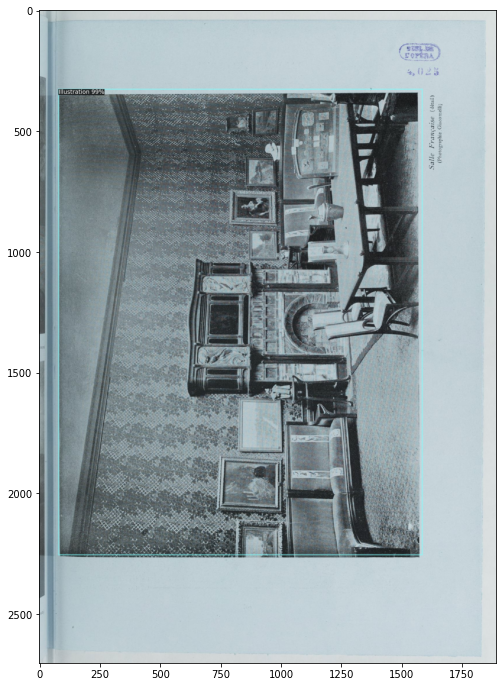

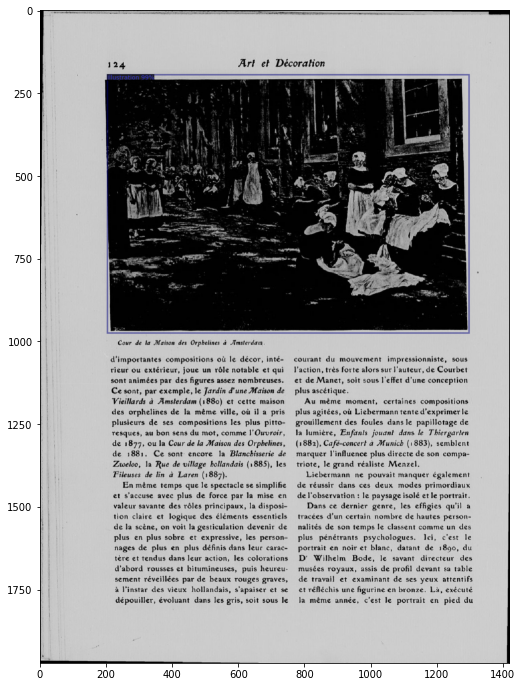

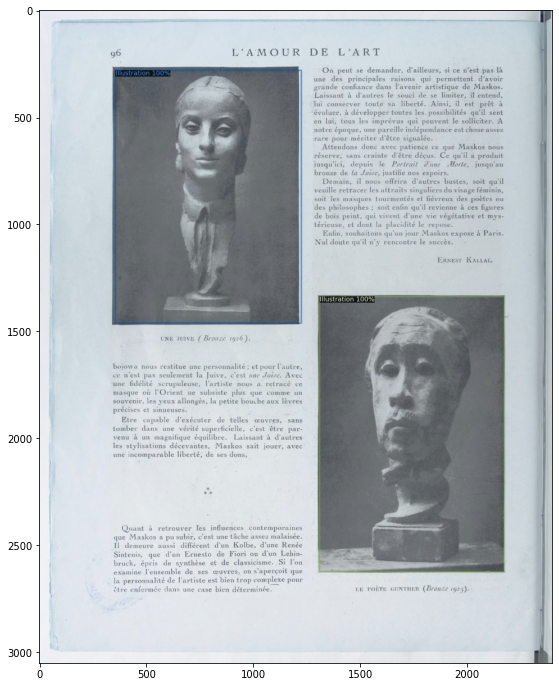

In [19]:
n_test_to_display = 20

# Only testing on a random subset
for d in random.sample(DatasetCatalog.get("DFKV_test"), n_test_to_display):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im) # Predictions
    v = Visualizer(im[:, :, ::-1],
                   metadata=MetadataCatalog.get("DFKV_test"), 
                   scale=1.2   )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #v = v.draw_dataset_dict(d)
    plt.figure(figsize=(15,12))
    plt.imshow(v.get_image()[:, :, ::-1])
    
    # if we want to save the images:
    # cv2.imwrite(filepath_here, v.get_image()[:, :, ::-1])


We already got much better results, using our data to train the model !